In [1]:
### import libraries ###
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [2]:
# set parameters
plt.rcParams.update({'text.usetex': True, 
                     'font.family': 'Helvetica', 
                     'font.size': 15})

In [3]:
### Define parameters ###
# [version] is the SEVN2 version adopted                            e.g. '3.0.0-Spindevel_RLO'
# [Nsim] is the number of simulations                               e.g. '1mln'
# [Z] is the metallicity of the stars                               e.g. '02' for Z=0.02 solar metallicity
# [SN] is the SN explosion prescription adopted                     e.g. 'del' for delayed or 'com' for compact
# [n] number of cores involved in dask computation                  e.g.  4
# [Hsup] is the threshold for spectroscopic WR                      e.g. '0.3' for WR with H < 0.3 on surface
# [thres_RL] is the threshold for Roche Lobe filling binaries
# [thres_wind] is the threshold for wind fed binaries


Nsim,Z,SN,kick= '1mln','02', 'com','unified265'                     # to select a set of simulations
version = '3.0.0-Spindevel_RLO'                                      # select SEVN2 version
ppisn = 'without'
path_result = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
n = 4                                                                # cores for dask computation
Hsup,thres_RL,thres_wind = 0.3,1.,0.8                                # for functions inside WRBH_select.py

dfname = 'BHBH_GW_WRBH_cyg_x-3--Ko17'
path_output = f'{path_result}/{dfname}/run_scripts/sevn_output'

# # select set to compare with
# Nold,Zold,SNold,kickold = '1mln','02', 'com', 'unified265'          # old parameters
# path_result2 = f'./v_{version}/{Nold}_Z{Zold}_{SNold}_{kickold}/ppisn_{ppisn}'
# path_output2 = f'{path_result2}/{dfname}/run_scripts/sevn_output'
# out2 = pd.read_csv(f'{path_output2}/output_0.csv')
# names2 = out2.name.drop_duplicates().values

# extract the output file
out = pd.read_csv(f'{path_output}/output_0.csv')
names = out.name.drop_duplicates().values

In [4]:
# extract the output file
# out = pd.read_csv('./v_3.0.0-Spindevel_RLO/1mln_Z015_com_unified265/dataframes/strange/run_scripts/sevn_output/output_0.csv')
# names = out.name.drop_duplicates().values

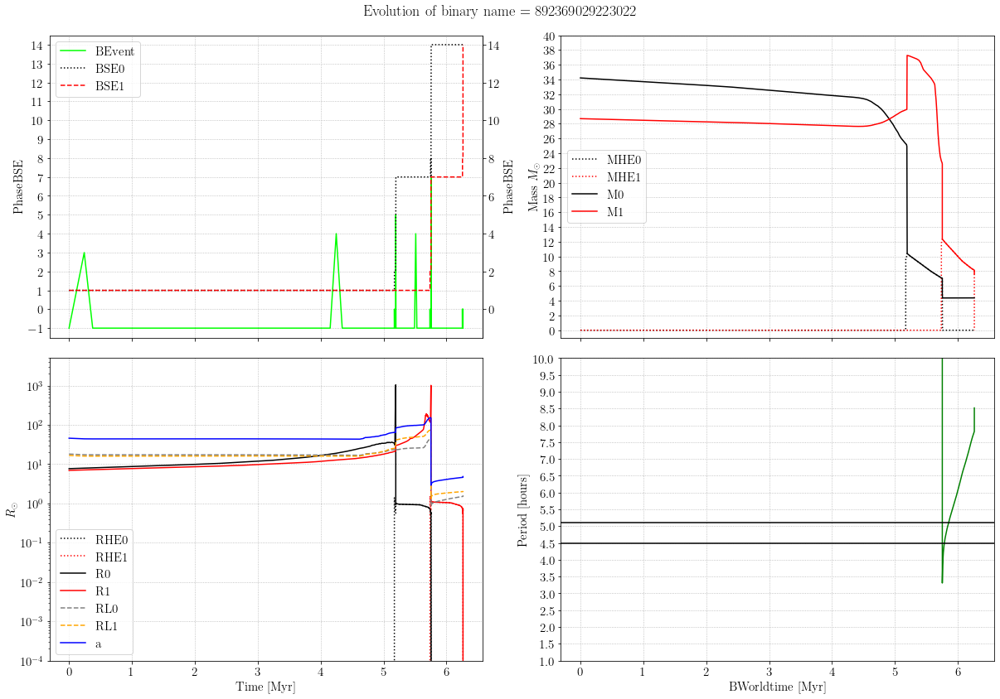

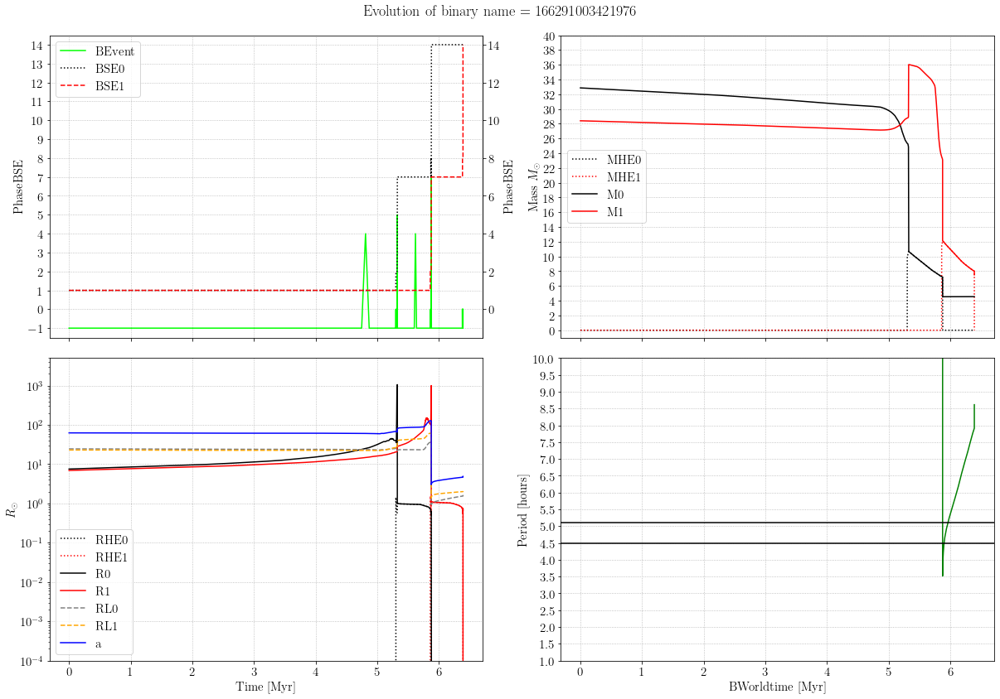

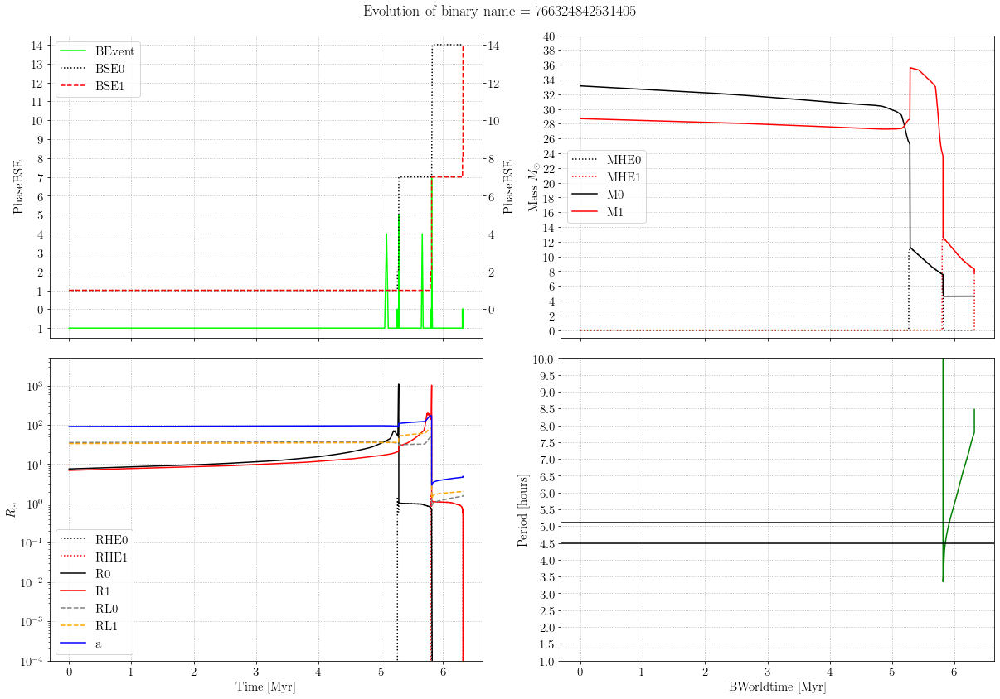

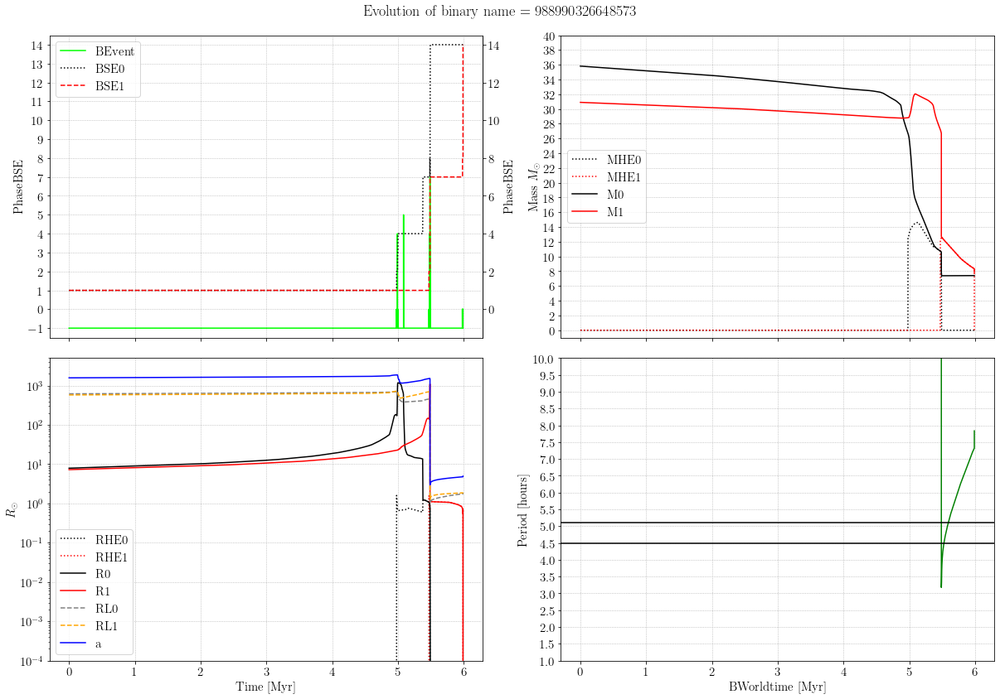

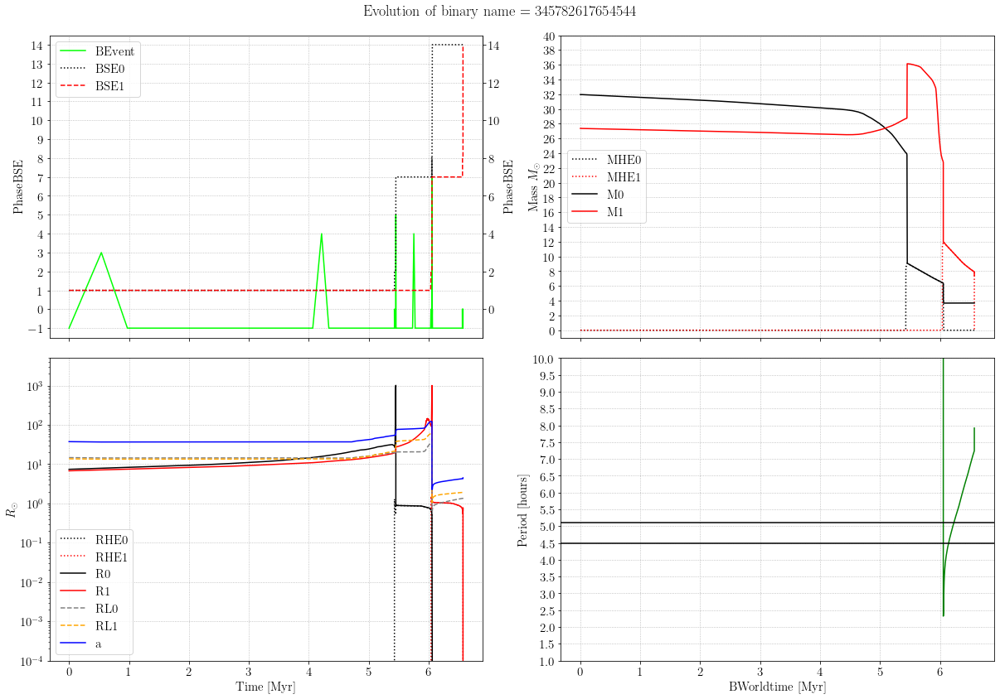

...

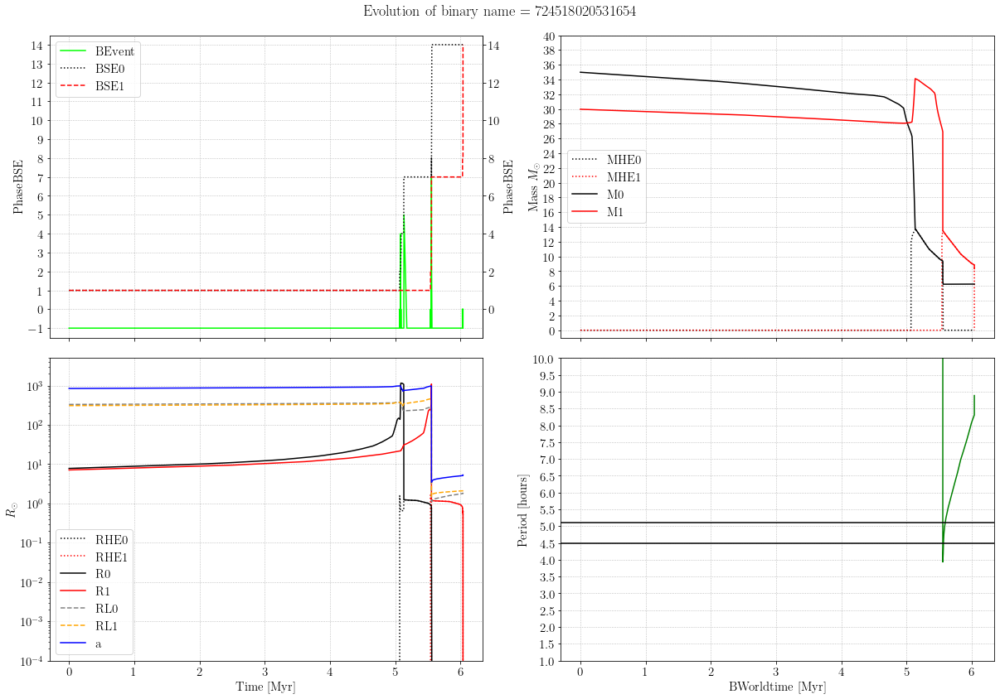

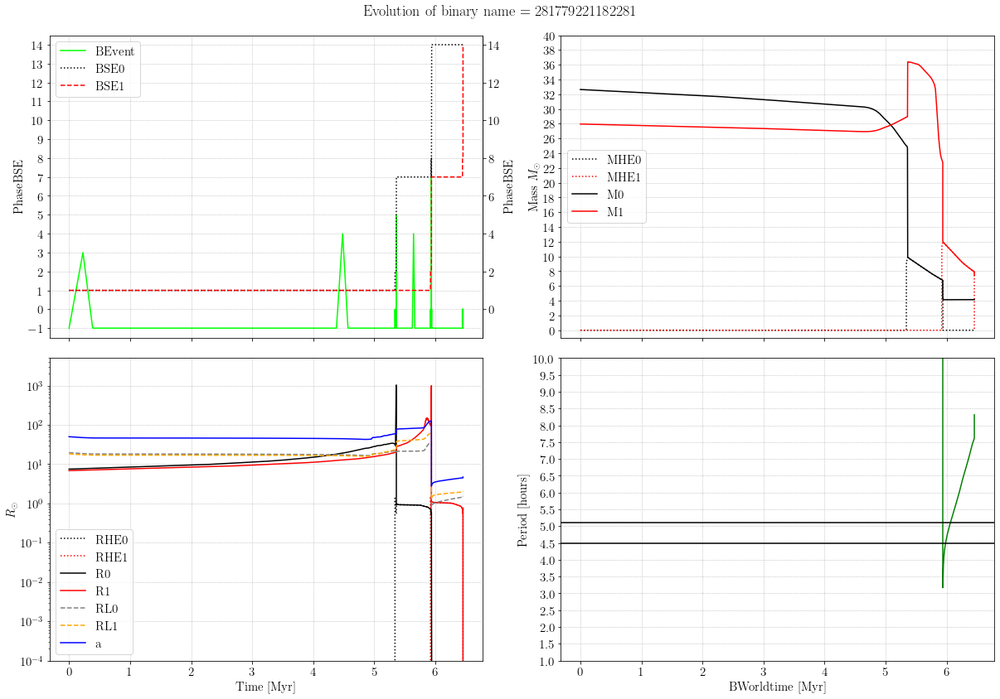

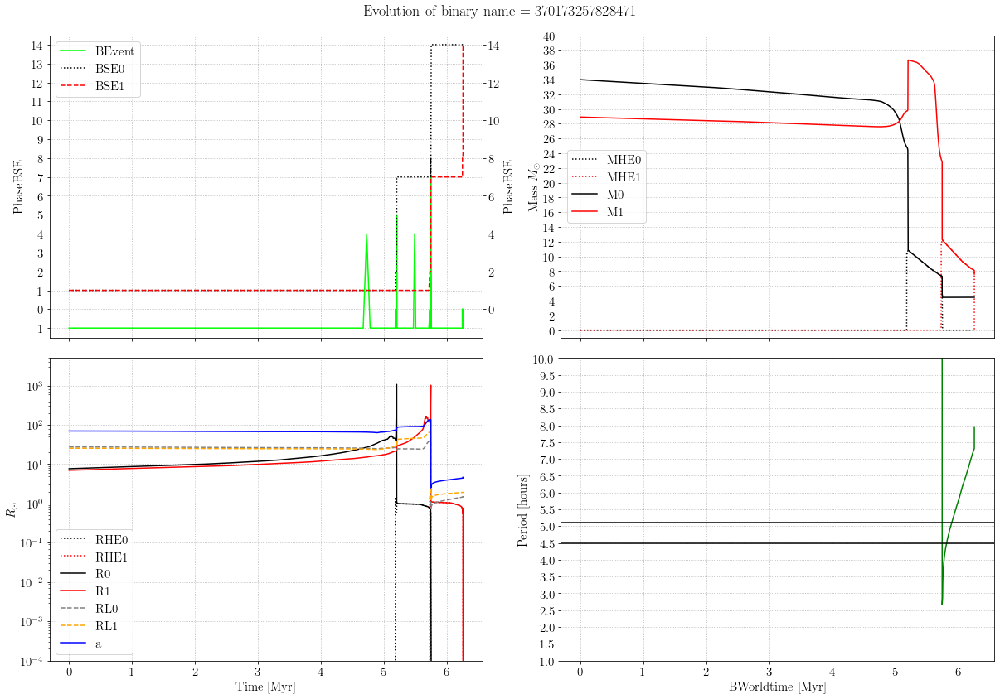

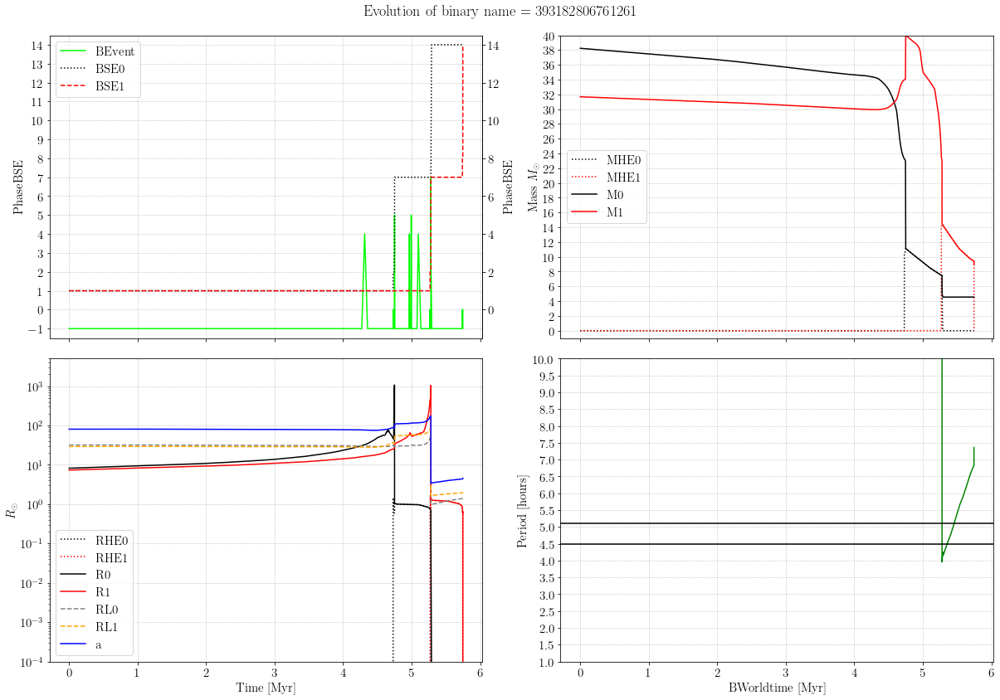

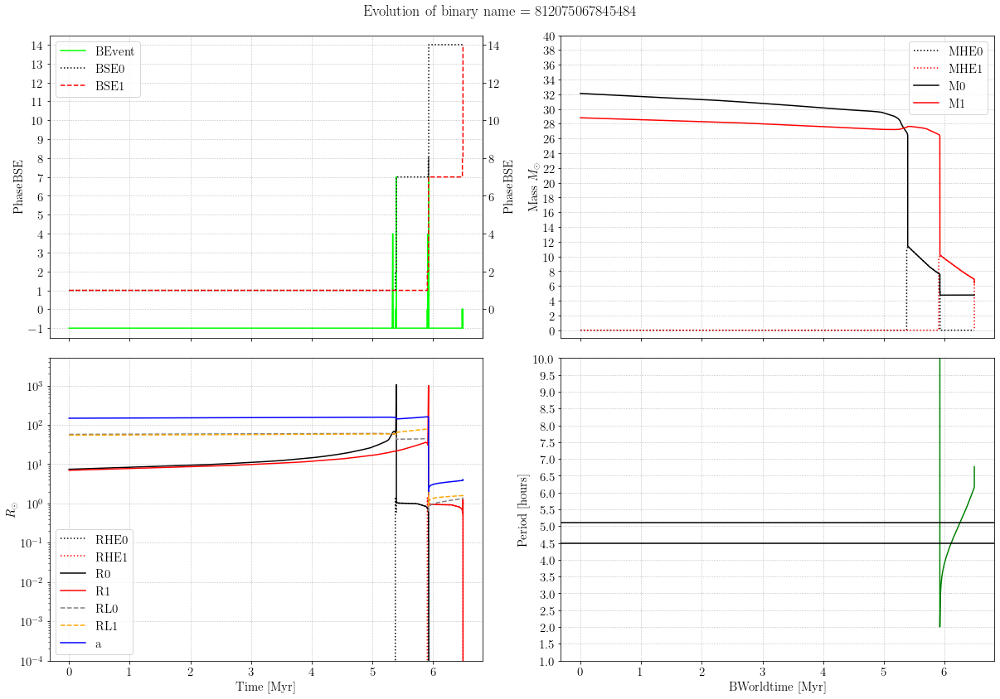

In [5]:
for name in names:

    binary = out[out.name == name] # select single binary

    ### plot ###
    fig, axs = plt.subplots(nrows = 2, ncols = 2, sharex=True,figsize = (17,12))
    #fig.suptitle(f'Evolution of binary name = {name} (set old: Z{Zold}, {SNold}, {kickold} with new Z{Z}, {SN}, {kick})')
    fig.suptitle(f'Evolution of binary name = {name}')

    axs[0][0].set_yticks(np.arange(-2,17+1,1))
    binary.plot(x='BWorldtime',y='BEvent', ax=axs[0][0], color='lime').set(xlabel=r'Time [Myr]',ylabel=r'BEvent')

    binary.plot(x='BWorldtime',y='PhaseBSE_0', ax=axs[0][0], color='k', linestyle='dotted',label='BSE0')
    binary.plot(x='BWorldtime',y='PhaseBSE_1', ax=axs[0][0], color='r', linestyle='dashed',label='BSE1').set(xlabel=r'Time [Myr]',ylabel=r'PhaseBSE')
    secaxy=axs[0][0].secondary_yaxis('right',functions=(lambda x: x, lambda x: x))
    secaxy.set_ylabel(r'PhaseBSE')
    axs[0][0].grid(ls=':')



    # axs[1][0].plot(binary['BWorldtime'],binary['Period']*24*365,  linestyle='dashdot',color='lime',label='P')
#     binary.plot(x='BWorldtime',y='Period', ax=axs[1][0], linestyle='dashdot',color='lime')
#     secaxy=axs[1][0].secondary_yaxis('right',functions=(lambda x: x, lambda x: x))
#     secaxy.set_ylabel(r'$\log P$ [yrs]')
#     secaxy.set_yscale('log')

    binary.plot(x='BWorldtime',y='RHE_0', ax=axs[1][0], color='k', linestyle='dotted', label='RHE0')
    binary.plot(x='BWorldtime',y='RHE_1', ax=axs[1][0], color='r', linestyle='dotted',label='RHE1')
    binary.plot(x='BWorldtime',y='Radius_0', ax=axs[1][0], color='k', label='R0')
    binary.plot(x='BWorldtime',y='Radius_1', ax=axs[1][0], color='r', label='R1')
    binary.plot(x='BWorldtime',y='RL0', ax=axs[1][0], linestyle='dashed', color='grey', label='RL0')
    binary.plot(x='BWorldtime',y='RL1', ax=axs[1][0], linestyle='dashed', color='orange', label='RL1')
    binary.plot(x='BWorldtime',y='Semimajor', ax=axs[1][0], color='blue', label='a').set(xlabel=r'Time [Myr]',ylabel=r'$R_\odot$')
    axs[1][0].set_yscale('log')
    axs[1][0].grid(ls=':')


    binary.plot(x='BWorldtime',y='MHE_0', ax=axs[0][1], color='k', linestyle='dotted', label='MHE0')
    binary.plot(x='BWorldtime',y='MHE_1', ax=axs[0][1], color='r', linestyle='dotted',label='MHE1')
    binary.plot(x='BWorldtime',y='Mass_0', ax=axs[0][1], color='k', label='M0')
    binary.plot(x='BWorldtime',y='Mass_1', ax=axs[0][1], color='r', label='M1').set(xlabel=r'Time [Myr]',ylabel=r'Mass $M_\odot$')
    axs[0][1].yaxis.set_major_locator(ticker.MultipleLocator(2))
    axs[0][1].grid(ls=':')



    axs[1][1].plot(binary.BWorldtime.values,binary.Period.values*365.*24., color='g')
    axs[1][1].axhline(4.5, color='k')
    axs[1][1].axhline(5.1, color='k')
    #axs[1][1].plot(binary.BWorldtime.values,binary.Radius_0.values/binary.RL0.values, color='k', label='RL0 fill')
    axs[1][1].yaxis.set_major_locator(ticker.MultipleLocator(.5))
    #axs[1][1].legend(loc='upper left')
    axs[1][1].set_xlabel('BWorldtime [Myr]')
    axs[1][1].set_ylabel('Period [hours]')
    axs[1][1].grid(ls=':')



    # set limits
#     xmin, xmax = 3.5,7.5
#     axs[0][0].set_xlim(xmin, xmax)
#     axs[0][1].set_xlim(xmin, xmax)
#     axs[1][0].set_xlim(xmin, xmax)
#     axs[1][1].set_xlim(xmin, xmax)

    axs[0][0].set_ylim(-1.5, 14.5)
    axs[0][1].set_ylim(-1, 40)
    axs[1][0].set_ylim(1e-4, 5e3)
    axs[1][1].set_ylim(1,10)



    ##########################################################
    fig.subplots_adjust(wspace = 0.3 )
    plt.tight_layout()
    plt.show()
    #fig.savefig(f'{path_result}/name{name}_Z{Z}_{SN}_{kick}.jpg')